# Import libraries

In [39]:
import os
import warnings

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

from random import random

from math import floor
from math import ceil
from math import log

from sklearn.metrics.cluster import v_measure_score
from sklearn.metrics import silhouette_score

from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from sklearn.neighbors import KernelDensity

from sklearn.preprocessing import MinMaxScaler

In [40]:
warnings.filterwarnings("ignore")

# Loading data and its preprocessing

In [41]:
full_description = ['MFGO, разб. 1:20',
                    'HGO, 0.0116 г в 25 мл H2O',
                    'GO, RusGraphene, 2 г в 1000 мл H2O',
                    'rGO, 2 г в 1000 мл H2O',
                    'rGO, RusGraphene, 2 г в 1000 мл H2O',
                    'GO, RusGraphene, 2 г в 1000 мл H2O',
                    'GO, RusGraphene, 1.00 г в 250 мл H2O',
                    'rGO, RusGraphene, 0.20 г в 100 мл H2O',
                    'GO, RusGraphene, 1.00 г в 250 мл H2O',
                    'GO, USA, 0.1 г в 100 мл H2O',
                    'GO, RusGraphene, 2 г в 1000 мл H2O',
                    'Образец 8 после диализа 7 дней, H2O, стакан 1 л, замена воды каждые 2 дня',
                    'Образец 8 после диализа 7 дней, H2O, стакан 1 л, замена воды каждые 2 дня',
                    'Образец 8 после диализа 3.5 кДа, конд. 7 дней в H2O',
                    'Образец 8 после диализа 3.5 кДа, конд. 7 дней в ЭДТА 0.05 М',
                    'Образец 10 после диализа 3.5 кДа, конд.',
                    'Образец 8 после диализа 3.5 кДа, конд. 7 дней в ЭДТА 0.05 М (повторное использование)',
                    'Образец 9 после диализа 14 кДа, конд. 7 дней в ЭДТА 0.05М',
                    'Образец 9 после диализа 14 кДа 75 мм, конд. 7 дней в ЭДТА 0.05М',
                    'Образец 9 после диализа 14 кДа 75 мм, конд. 7 дней в ЭДТА 0.05М (повторное использование)',
                    'Образец 11 после диализа 2 дня, H2O, 1 кДа',
                    'Образец 11 после диализа 5 дней, H2O, 14 кДа 75 мм',
                    'Образец 9 после диализа при 25°С 14 кДа, конд. 7 дней в ЭДТА 0.05М',
                    'Образец 9 после диализа при 45°С 14 кДа, конд. 7 дней в ЭДТА 0.05М',
                    'Образец 13 после диализа 0.5 кДа, конд. 7 дней в ЭДТА 0.05М',
                    'Образец 30 после диализа 12 дней, 14 кДа, конд. 7 дней в ЭДТА 0.05М']

short_description = ['$GO$',
                     '$GO$',
                     '$GO$',
                     '$rGO$',
                     '$rGO$',
                     '$GO$',
                     '$GO$',
                     '$rGO$',
                     '$GO$',
                     '$GO$',
                     '$GO$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$rGO$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$',
                     '$GO_{d}$']

class_lst = [0 if el == '$rGO$' else 1 if el == '$GO$' else 2 for el in short_description]

In [42]:
path_to_colloid_data = './../../data/colloidal_parameters/colloidal_parameters.xlsx'

data = pd.read_excel(path_to_colloid_data)
data = data.rename(columns={'Шифр': 'id',
                            'PDI': '$PDI$',
                            'dсредний, нм': '$d_{average}, nm$',
                            'Z, мВ': '$Z, mV$'})

data.drop(columns='id', inplace=True)

data.insert(loc=0, column='$Class$', value=class_lst)
data.insert(loc=1, column='$Type$', value=short_description)

data.head(3)

,$Class$,$Type$,$PDI$,"$d_{average}, nm$","$Z, mV$"
0,1,$GO$,0.496,1417.0,-8.2
1,1,$GO$,0.301,352.9,-28.0
2,1,$GO$,0.916,3286.3,-33.5


In [43]:
initial_data = data.copy()

In [44]:
scaler = MinMaxScaler()

data[['$PDI$', '$d_{average}, nm$', '$Z, mV$']] = scaler.fit_transform(data[['$PDI$', '$d_{average}, nm$', '$Z, mV$']])

data.head(3)

,$Class$,$Type$,$PDI$,"$d_{average}, nm$","$Z, mV$"
0,1,$GO$,0.329073,0.290777,1.000000
1,1,$GO$,0.017572,0.018524,0.333333
2,1,$GO$,1.000000,0.769042,0.148148


# Data visualization

In [45]:
path_to_save = './../../results/colloidal_parameters'

## PairPlot

In [1]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

# palette = ['viridis', 'cubehelix', 'vlag', 'icefire', 'Spectral']

pair_plot = sns.pairplot(data=initial_data.iloc[:, 1:],
                         hue='$Type$',
                         diag_kind='hist',
                         size=2.0,
                         plot_kws={"s": 25},
                         corner=True
                        )

# pair_plot.fig.set_size_inches(8, 4)

sns.set_context("paper", rc={"axes.labelsize": 8})

plt.tight_layout()
plt.savefig(path_to_save + '/pairplot.png')
plt.show()

NameError: name 'plt' is not defined

## Histogram

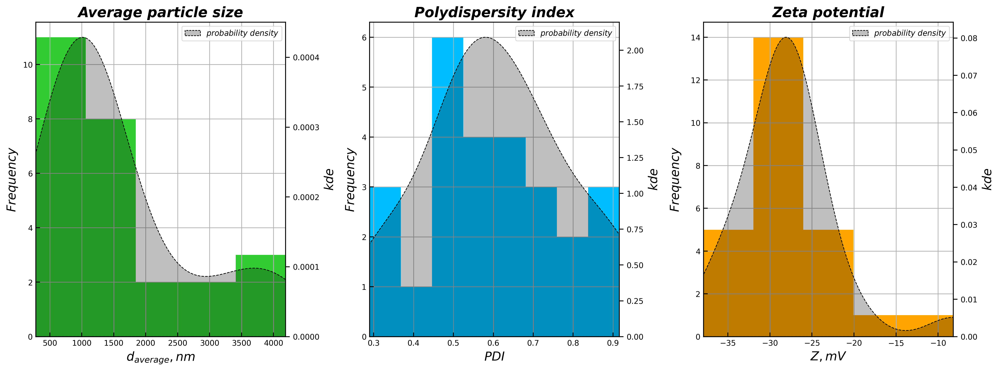

In [47]:
fig = plt.figure(figsize=(16, 6), dpi=300, linewidth=1.0)

nrows = 1
ncols = 3


# SIZE-HISTOGRAM

plt.subplot(nrows, ncols, 1)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()
ax_twinx = ax.twinx()  

ax.set_title('Average particle size',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

ax.hist(x=initial_data['$d_{average}, nm$'].to_numpy(),
        bins=5,
        color='limegreen')

sns.kdeplot(data=initial_data['$d_{average}, nm$'].to_numpy(),
            ax=ax_twinx,
            color='black',
            linestyle='--',
            fill=True,
            label='$probability$ $density$')

ax.set_xlabel('$d_{average}, nm$',
              fontname='DejaVu Sans',
              fontsize=14)
ax.set_ylabel('$Frequency$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=90,
              labelpad=5)

ax_twinx.set_ylabel('$kde$',
                    fontname='DejaVu Sans',
                    fontsize=14,
                    rotation=90,
                    labelpad=5)

ax.set_xlim(initial_data['$d_{average}, nm$'].min(), initial_data['$d_{average}, nm$'].max())

plt.legend()


# PDI-HISTOGRAM

plt.subplot(nrows, ncols, 2)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()
ax_twinx = ax.twinx()  

ax.set_title('Polydispersity index',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

ax.hist(x=initial_data['$PDI$'].to_numpy(),
        bins=8,
        color='deepskyblue')

sns.kdeplot(data=initial_data['$PDI$'].to_numpy(),
            ax=ax_twinx,
            color='black',
            linestyle='--',
            fill=True,
            label='$probability$ $density$')

ax.set_xlabel('$PDI$',
              fontname='DejaVu Sans',
              fontsize=14)
ax.set_ylabel('$Frequency$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=90,
              labelpad=5)

ax_twinx.set_ylabel('$kde$',
                    fontname='DejaVu Sans',
                    fontsize=14,
                    rotation=90,
                    labelpad=5)

ax.set_xlim(initial_data['$PDI$'].min(), initial_data['$PDI$'].max())

plt.legend()


# ZETA-HISTOGRAM

plt.subplot(nrows, ncols, 3)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()
ax_twinx = ax.twinx()

ax.set_title('Zeta potential',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

ax.hist(x=initial_data['$Z, mV$'].to_numpy(),
        bins=5,
        color='orange')

sns.kdeplot(data=initial_data['$Z, mV$'].to_numpy(),
            ax=ax_twinx,
            color='black',
            linestyle='--',
            fill=True,
            label='$probability$ $density$')

ax.set_xlabel('$Z, mV$',
              fontname='DejaVu Sans',
              fontsize=14)
ax.set_ylabel('$Frequency$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=90,
              labelpad=10)

ax_twinx.set_ylabel('$kde$',
                    fontname='DejaVu Sans',
                    fontsize=14,
                    rotation=90,
                    labelpad=5)

ax.set_yticks(np.arange(0, 15, 2))
ax.set_xlim(initial_data['$Z, mV$'].min(), initial_data['$Z, mV$'].max())

plt.legend()


plt.tight_layout()

plt.savefig(path_to_save + '/parameters_distribution.png', dpi=600)
plt.show()

## BoxPlot

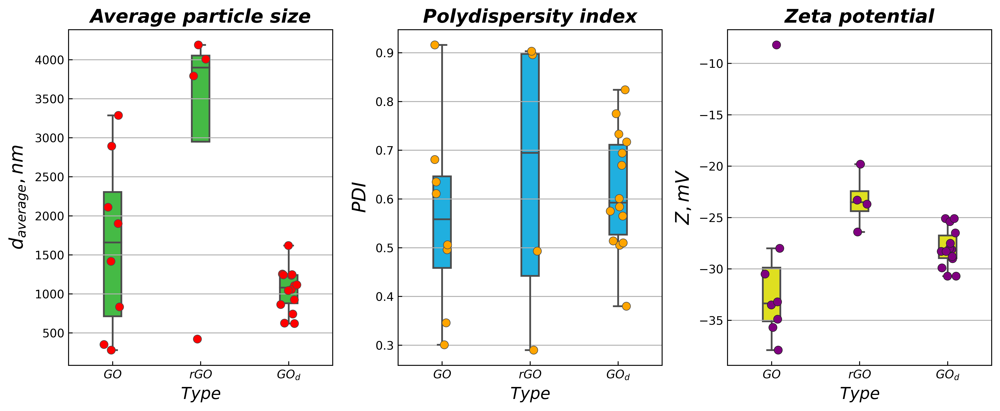

In [48]:
fig = plt.figure(figsize=(12, 5), dpi=600, linewidth=1.0)

nrows = 1
ncols = 3

s = 7

plt.style.use('default')


# SIZE

plt.subplot(nrows, ncols, 1)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Average particle size',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.boxplot(data=initial_data,
            x='$Type$',
            y='$d_{average}, nm$',
            width=0.2,
            color='limegreen',
            showfliers=False,
            ax=ax)

sns.stripplot(data=initial_data,
              x='$Type$',
              y='$d_{average}, nm$',
              color='red',
              alpha=1,
              s=s,
              linewidth=0.5,
              ax=ax)

ax.set_ylabel('$d_{average}, nm$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)


# PDI

plt.subplot(nrows, ncols, 2)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Polydispersity index',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.boxplot(data=initial_data,
            x='$Type$',
            y='$PDI$',
            width=0.2,
            color='deepskyblue',
            showfliers=False,
            ax=ax)

sns.stripplot(data=initial_data,
              x='$Type$',
              y='$PDI$',
              color='orange',
              s=s,
              alpha=1,
              linewidth=0.5,
              ax=ax)

ax.set_ylabel('$PDI$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)


# ZETA
plt.subplot(nrows, ncols, 3)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Zeta potential',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.boxplot(data=initial_data,
            x='$Type$',
            y='$Z, mV$',
            width=0.2,
            color='yellow',
            showfliers=False,
            ax=ax)

sns.stripplot(data=initial_data,
              x='$Type$',
              y='$Z, mV$',
              color='purple',
              alpha=1,
              s=s,
              linewidth=0.5,
              ax=ax)

ax.set_ylabel('$Z, mV$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)

plt.tight_layout()


plt.savefig(path_to_save + '/boxplot_one_row.png', dpi=600)
plt.show()

In [49]:
# fig, ax = plt.subplot_mosaic([['left_up', 'right_up'],
#                               ['center_down', 'center_down']],
#                              gridspec_kw={'width_ratios': [1, 1]},
#                              figsize=(5, 5),
#                              linewidth=1.0,
#                              dpi=300,
#                              layout='constrained')

# nrows = 1
# ncols = 3

# plt.title('BoxPlot')

# grid = gridspec.GridSpec(2, 4)

# fontsize_title = 10
# fontsize_label = 12

# # BOX-PLOT (РАЗМЕРЫ)
# ax_size = plt.subplot(grid[0, 0:2])
# ax_size.grid(True)
# ax_size.tick_params(direction='in')
# ax_size.set_title('Average particle\nsize',
#              fontname='DejaVu Sans',
#              fontsize=fontsize_title,
#              fontstyle='italic',
#              fontweight='bold')
# sns.boxplot(data=initial_df,
#             y=initial_df['$d_{average}, nm$'],
#             width=0.2,
#             color='limegreen',
#             showfliers=False,
#             ax=ax_size)
# sns.stripplot(data=initial_df,
#               y=initial_df['$d_{average}, nm$'],
#               color='red',
#               alpha=1,
#               linewidth=0.5,
#               ax=ax_size)
# ax_size.set_ylabel('$d_{average}, nm$',
#                          fontname='DejaVu Sans',
#                          fontsize=fontsize_label,
#                          rotation=90,
#                          labelpad=5)

# # BOX-PLOT (ИНДЕКС ПОЛИДИСПЕРСНОСТИ)
# ax_pdi = plt.subplot(grid[0, 2:4])
# ax_pdi.grid(True)
# ax_pdi.tick_params(direction='in')
# ax_pdi.set_title('Polydispersity\nindex',
#              fontname='DejaVu Sans',
#              fontsize=fontsize_title,
#              fontstyle='italic',
#              fontweight='bold')
# sns.boxplot(data=initial_df,
#             y=initial_df['$PDI$'],
#             width=0.2,
#             color='deepskyblue',
#             showfliers=False,
#             ax=ax_pdi)
# sns.stripplot(data=initial_df,
#               y=initial_df['$PDI$'],
#               color='orange',
#               alpha=1,
#               linewidth=0.5,
#               ax=ax_pdi)
# ax_pdi.set_ylabel('$PDI$',
#                   fontname='DejaVu Sans',
#                   fontsize=fontsize_label,
#                   rotation=90,
#                   labelpad=5)

# # BOX-PLOT (ЗЕТА)
# ax_zeta = plt.subplot(grid[1, 1:3])
# ax_zeta.grid(True)
# ax_zeta.tick_params(direction='in')
# ax_zeta.set_title('Zeta\npotential',
#                             fontname='DejaVu Sans',
#                             fontsize=fontsize_title,
#                             fontstyle='italic',
#                             fontweight='bold')
# sns.boxplot(data=initial_df,
#             y=initial_df['$Z, mV$'],
#             width=0.2,
#             color='yellow',
#             showfliers=False,
#             ax=ax_zeta)
# sns.stripplot(data=initial_df,
#               y=initial_df['$Z, mV$'],
#               color='purple',
#               alpha=1,
#               linewidth=0.5,
#               ax=ax_zeta)
# ax_zeta.set_ylabel('$Z, mV$',
#                              fontname='DejaVu Sans',
#                              fontsize=fontsize_label,
#                              rotation=90,
#                              labelpad=5)
# plt.tight_layout()
# plt.savefig(path_to_save + '/boxplot_two_rows.png', dpi=600)
# plt.show()

## ViolinPlot

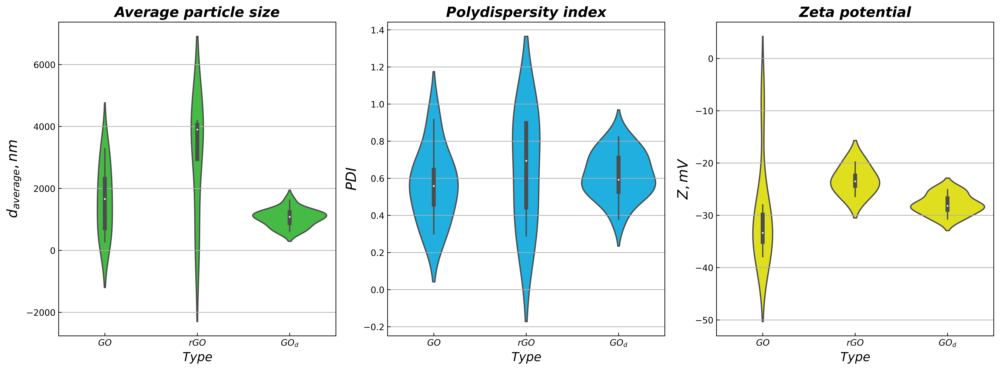

In [50]:
plt.rcParams['figure.dpi'] = 600
# plt.rcParams['savefig.dpi'] = 600


fig = plt.figure(figsize=(16, 6), dpi=600, linewidth=1.0)

nrows = 1
ncols = 3

# sns.set_context("paper", rc={"axes.labelsize": 12})

plt.style.use('default')


# SIZE

plt.subplot(nrows, ncols, 1)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Average particle size',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.violinplot(data=initial_data,
               x='$Type$',
               y='$d_{average}, nm$',
               color='limegreen',
               ax=ax)

ax.set_ylabel('$d_{average}, nm$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)


# PDI

plt.subplot(nrows, ncols, 2)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Polydispersity index',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.violinplot(data=initial_data,
               x='$Type$',
               y='$PDI$',
               color='deepskyblue',
               ax=ax)

ax.set_ylabel('$PDI$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)


# ZETA

plt.subplot(nrows, ncols, 3)

plt.grid(True)
plt.tick_params(direction='in')

ax = fig.gca()

ax.set_title('Zeta potential',
             fontname='DejaVu Sans',
             fontsize=16,
             fontstyle='italic',
             fontweight='bold')

sns.violinplot(data=initial_data,
               x='$Type$',
               y='$Z, mV$',
               color='yellow',
               ax=ax)

ax.set_ylabel('$Z, mV$',
              fontname='DejaVu Sans',
              fontsize=16,
              rotation=90,
              labelpad=5)
ax.set_xlabel('$Type$',
              fontname='DejaVu Sans',
              fontsize=14,
              rotation=0,
              labelpad=5)


plt.tight_layout()

plt.savefig(path_to_save + '/violinplot_one_row.png', dpi=600)
plt.show()

## JointPlot

### *Size*

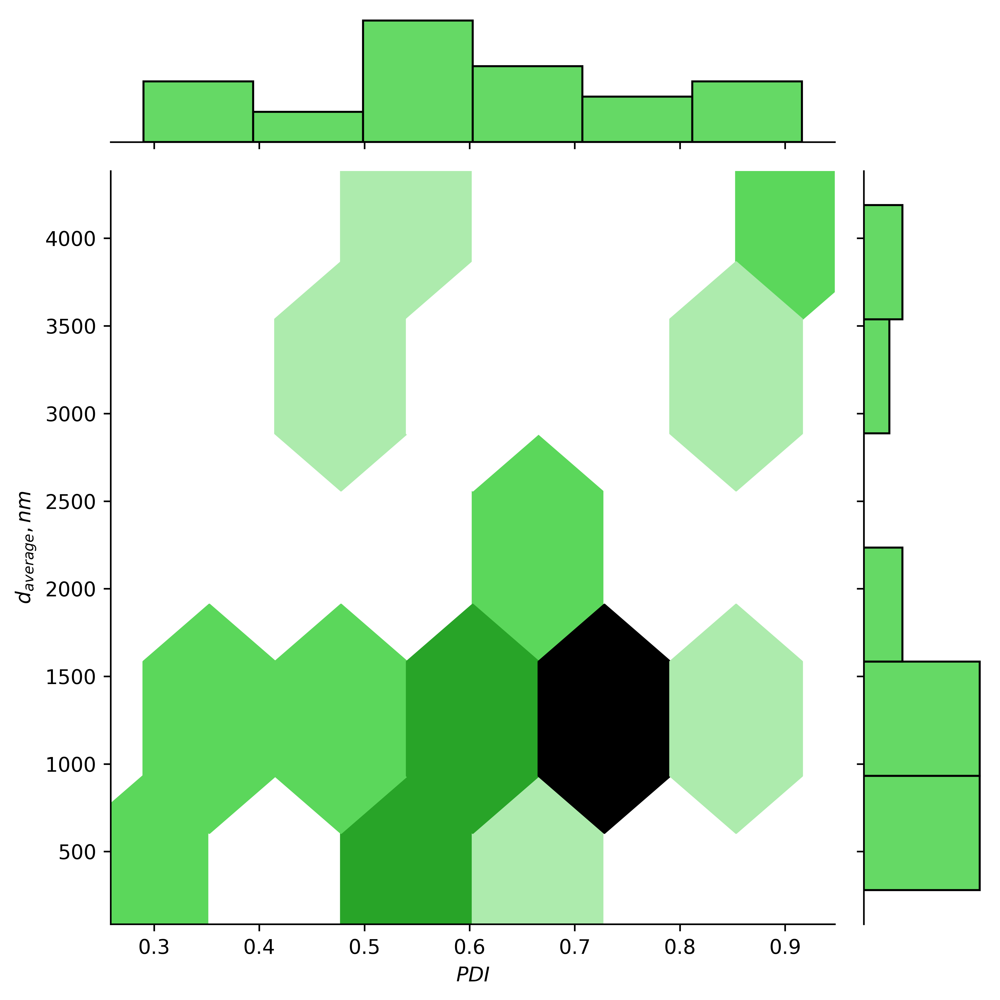

In [51]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

jpl = sns.jointplot(data=initial_data,
                    x='$PDI$',
                    y='$d_{average}, nm$',
                    kind='hex',
                    height=7,
                    color='limegreen'
                   )

plt.tight_layout()
plt.savefig(path_to_save + '/jointplot_pdi_size.png', dpi=600)
plt.show()

### *PDI*

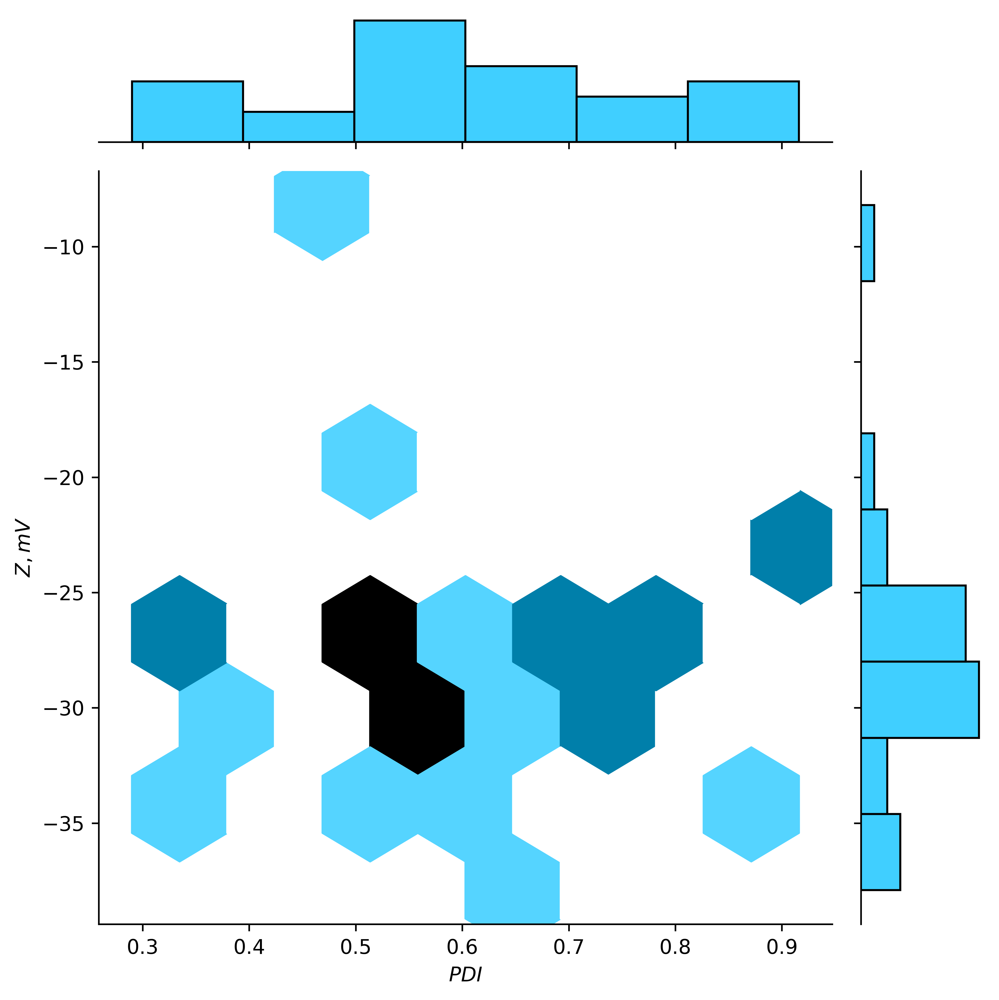

In [52]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

jpl = sns.jointplot(data=initial_data,
                    x='$PDI$',
                    y='$Z, mV$',
                    kind='hex',
                    height=7,
                    color='deepskyblue'
                   )

plt.tight_layout()
plt.savefig(path_to_save + '/jointplot_pdi_zeta.png', dpi=600)
plt.show()

### *Zeta*

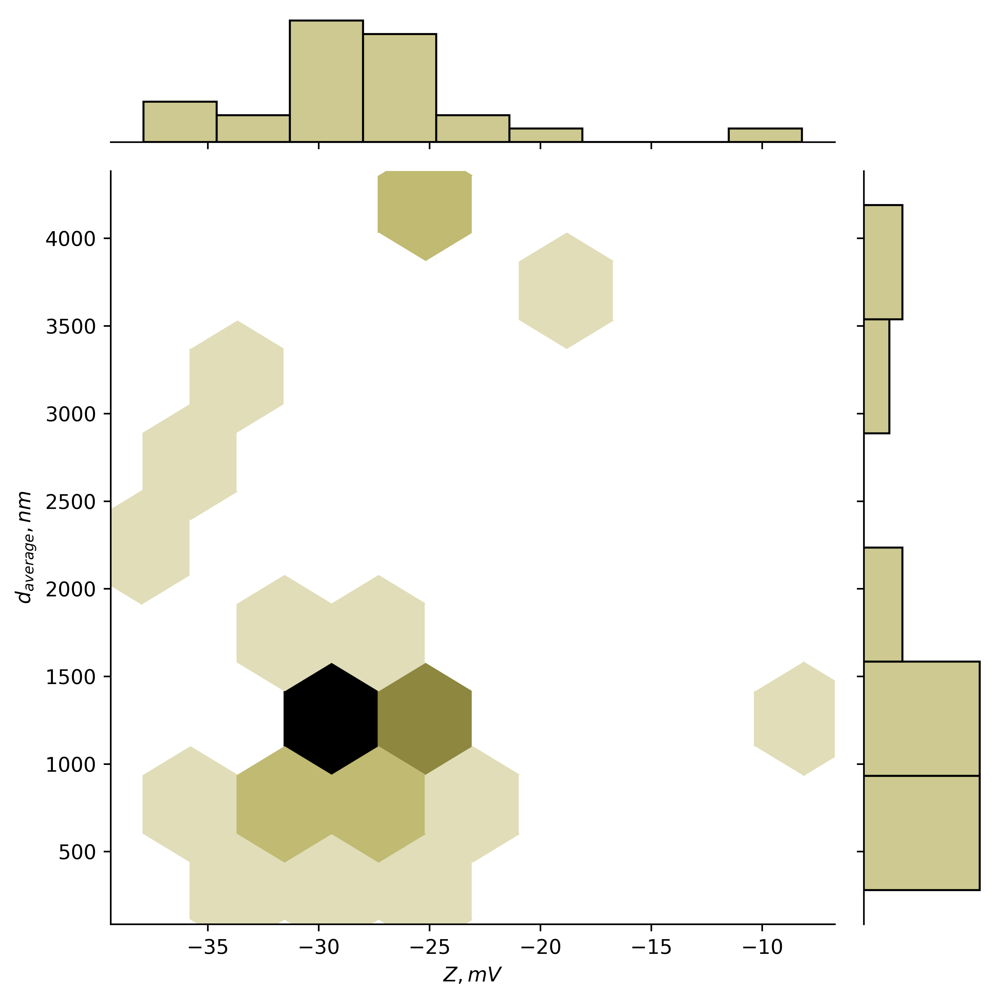

In [53]:
plt.rcParams['figure.dpi'] = 600
plt.rcParams['savefig.dpi'] = 600

jpl = sns.jointplot(data=initial_data,
                    x='$Z, mV$',
                    y='$d_{average}, nm$',
                    kind='hex',
                    height=7,
                    color='darkkhaki'
                   )

plt.tight_layout()
plt.savefig(path_to_save + '/jointplot_zeta_size.png', dpi=600)
plt.show()

# Feature Engineering

**Initial Features transform to:**
* all possible ($C_{3}^{2} = 3$) ratios ($x/y$ combinations)
* featuters in **n (2-4)** power;
* featuters in **–n (2-4)** power;
* log (base — **e**).

In [54]:
corr_labels = {'$PDI$': '$PDI_{n}$',
               '$d_{average}, nm$': '$d_{av, n}$',
               '$Z, mV$': '$Z_{n}$'}


initial_features = initial_data.iloc[:, 2:].copy().rename(columns=corr_labels)
initial_features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$
0,0.496,1417.0,-8.2
1,0.301,352.9,-28.0
2,0.916,3286.3,-33.5


In [55]:
features = initial_features.copy()

features_names = initial_features.columns

In [56]:
# Step 1

for i in range(len(features_names)):
    feature1 = features_names[i]
    feature1_clear = feature1.replace('_{n}', '').replace(', n', '').replace('$', '')
    for j in range(i+1, len(features_names)):
        feature2 = features_names[j]
        feature2_clear = feature2.replace('_{n}', '').replace(', n', '').replace('$', '')
        new_feature = '$(\\frac{' + feature1_clear + '}{' + feature2_clear + '})_{n}$'
        features[new_feature] = features[feature1] / features[feature2]

features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$
0,0.496,1417.0,-8.2,0.000350,-0.060488,-172.804878
1,0.301,352.9,-28.0,0.000853,-0.010750,-12.603571
2,0.916,3286.3,-33.5,0.000279,-0.027343,-98.098507


In [57]:
# Step 2

for n in range(2, 5):
    for i in range(len(features_names)):
        feature = features_names[i]
        feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
        new_feature = '$(' + feature_clear + ')_{n}^' + f'{n}$'
        features[new_feature] = features[feature1] ** n

features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$,$(PDI)_{n}^2$,$(d_{av})_{n}^2$,$(Z)_{n}^2$,$(PDI)_{n}^3$,$(d_{av})_{n}^3$,$(Z)_{n}^3$,$(PDI)_{n}^4$,$(d_{av})_{n}^4$,$(Z)_{n}^4$
0,0.496,1417.0,-8.2,0.000350,-0.060488,-172.804878,67.24,67.24,67.24,-551.368,-551.368,-551.368,4.521218e+03,4.521218e+03,4.521218e+03
1,0.301,352.9,-28.0,0.000853,-0.010750,-12.603571,784.00,784.00,784.00,-21952.000,-21952.000,-21952.000,6.146560e+05,6.146560e+05,6.146560e+05
2,0.916,3286.3,-33.5,0.000279,-0.027343,-98.098507,1122.25,1122.25,1122.25,-37595.375,-37595.375,-37595.375,1.259445e+06,1.259445e+06,1.259445e+06


In [58]:
# Step 3

for n in range(-2, -5, -1):
    for i in range(len(features_names)):
        feature = features_names[i]
        feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
        new_feature = '$(' + feature_clear + ')_{n}^{' + f'{n}' + '}$'
        features[new_feature] = features[feature] ** (n)

features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$,$(PDI)_{n}^2$,$(d_{av})_{n}^2$,$(Z)_{n}^2$,$(PDI)_{n}^3$,...,$(Z)_{n}^4$,$(PDI)_{n}^{-2}$,$(d_{av})_{n}^{-2}$,$(Z)_{n}^{-2}$,$(PDI)_{n}^{-3}$,$(d_{av})_{n}^{-3}$,$(Z)_{n}^{-3}$,$(PDI)_{n}^{-4}$,$(d_{av})_{n}^{-4}$,$(Z)_{n}^{-4}$
0,0.496,1417.0,-8.2,0.000350,-0.060488,-172.804878,67.24,67.24,67.24,-551.368,...,4.521218e+03,4.064776,4.980355e-07,0.014872,8.195113,3.514718e-10,-0.001814,16.522406,2.480394e-13,2.211794e-04
1,0.301,352.9,-28.0,0.000853,-0.010750,-12.603571,784.00,784.00,784.00,-21952.000,...,6.146560e+05,11.037406,8.029651e-06,0.001276,36.669122,2.275333e-08,-0.000046,121.824326,6.447530e-11,1.626926e-06
2,0.916,3286.3,-33.5,0.000279,-0.027343,-98.098507,1122.25,1122.25,1122.25,-37595.375,...,1.259445e+06,1.191816,9.259458e-08,0.000891,1.301109,2.817594e-11,-0.000027,1.420424,8.573757e-15,7.940005e-07


In [59]:
# Step 4

for sym, base in zip(['e'], [np.e]):
    for i in range(len(features_names)):
        feature = features_names[i]
        feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
        new_feature = f'$(log_' + '{' + f'{sym}' + '}(|' + feature_clear + '|))_{n}$'
        features[new_feature] = features[feature].apply(lambda x: log(abs(x), base))
        
features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$,$(PDI)_{n}^2$,$(d_{av})_{n}^2$,$(Z)_{n}^2$,$(PDI)_{n}^3$,...,$(Z)_{n}^{-2}$,$(PDI)_{n}^{-3}$,$(d_{av})_{n}^{-3}$,$(Z)_{n}^{-3}$,$(PDI)_{n}^{-4}$,$(d_{av})_{n}^{-4}$,$(Z)_{n}^{-4}$,$(log_{e}(|PDI|))_{n}$,$(log_{e}(|d_{av}|))_{n}$,$(log_{e}(|Z|))_{n}$
0,0.496,1417.0,-8.2,0.000350,-0.060488,-172.804878,67.24,67.24,67.24,-551.368,...,0.014872,8.195113,3.514718e-10,-0.001814,16.522406,2.480394e-13,2.211794e-04,-0.701179,7.256297,2.104134
1,0.301,352.9,-28.0,0.000853,-0.010750,-12.603571,784.00,784.00,784.00,-21952.000,...,0.001276,36.669122,2.275333e-08,-0.000046,121.824326,6.447530e-11,1.626926e-06,-1.200645,5.866185,3.332205
2,0.916,3286.3,-33.5,0.000279,-0.027343,-98.098507,1122.25,1122.25,1122.25,-37595.375,...,0.000891,1.301109,2.817594e-11,-0.000027,1.420424,8.573757e-15,7.940005e-07,-0.087739,8.097518,3.511545


In [60]:
# Scaling

columns = features.columns

scaler = MinMaxScaler()
features = pd.DataFrame(scaler.fit_transform(features), columns=columns)

features['$Type$'] = initial_data['$Type$']
features['$Class$'] = initial_data['$Class$']

features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$,$(PDI)_{n}^2$,$(d_{av})_{n}^2$,$(Z)_{n}^2$,$(PDI)_{n}^3$,...,$(d_{av})_{n}^{-3}$,$(Z)_{n}^{-3}$,$(PDI)_{n}^{-4}$,$(d_{av})_{n}^{-4}$,$(Z)_{n}^{-4}$,$(log_{e}(|PDI|))_{n}$,$(log_{e}(|d_{av}|))_{n}$,$(log_{e}(|Z|))_{n}$,$Type$,$Class$
0,0.329073,0.290777,1.000000,0.107421,0.000000,0.102205,0.000000,0.000000,0.000000,1.000000,...,0.007459,0.000000,0.107897,0.001515,1.000000,0.466636,0.599089,0.000000,$GO$,1
1,0.017572,0.018524,0.333333,0.352948,0.979169,0.977305,0.523500,0.523500,0.523500,0.602873,...,0.502012,0.984858,0.860236,0.399128,0.005176,0.032370,0.084927,0.802232,$GO$,1
2,1.000000,0.769042,0.148148,0.072610,0.652504,0.510288,0.770547,0.770547,0.770547,0.312581,...,0.000322,0.995416,0.000000,0.000033,0.001402,1.000000,0.910232,0.919386,$GO$,1


## Summarizing function

In [61]:
def generate_features(data, scale=None):
    
    # 0
    features = data.copy()
    features_names = data.columns
    
    
    # 1
    for i in range(len(features_names)):
        feature1 = features_names[i]
        feature1_clear = feature1.replace('_{n}', '').replace(', n', '').replace('$', '')
        for j in range(i+1, len(features_names)):
            feature2 = features_names[j]
            feature2_clear = feature2.replace('_{n}', '').replace(', n', '').replace('$', '')
            new_feature = '$(\\frac{' + feature1_clear + '}{' + feature2_clear + '})_{n}$'
            features[new_feature] = features[feature1] / features[feature2]
    
    
    # 2
    for n in range(2, 5):
        for i in range(len(features_names)):
            feature = features_names[i]
            feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
            new_feature = '$(' + feature_clear + ')_{n}^' + f'{n}$'
            features[new_feature] = features[feature1] ** n
    
    
    # 3
    for n in range(-2, -5, -1):
        for i in range(len(features_names)):
            feature = features_names[i]
            feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
            new_feature = '$(' + feature_clear + ')_{n}^{' + f'{n}' + '}$'
            features[new_feature] = features[feature] ** (n)
    
    
    # 4
    for sym, base in zip(['e'], [np.e]):
        for i in range(len(features_names)):
            feature = features_names[i]
            feature_clear = feature.replace('_{n}', '').replace(', n', '').replace('$', '')
            new_feature = f'$(log_' + '{' + f'{sym}' + '}(|' + feature_clear + '|))_{n}$'
            features[new_feature] = features[feature].apply(lambda x: log(abs(x), base))
    
    # scaling
    if scale:
        scaler = MinMaxScaler()
        features = scaler.fit_transform(features)
    
    return features

# Correlation Matrix

## Part of features

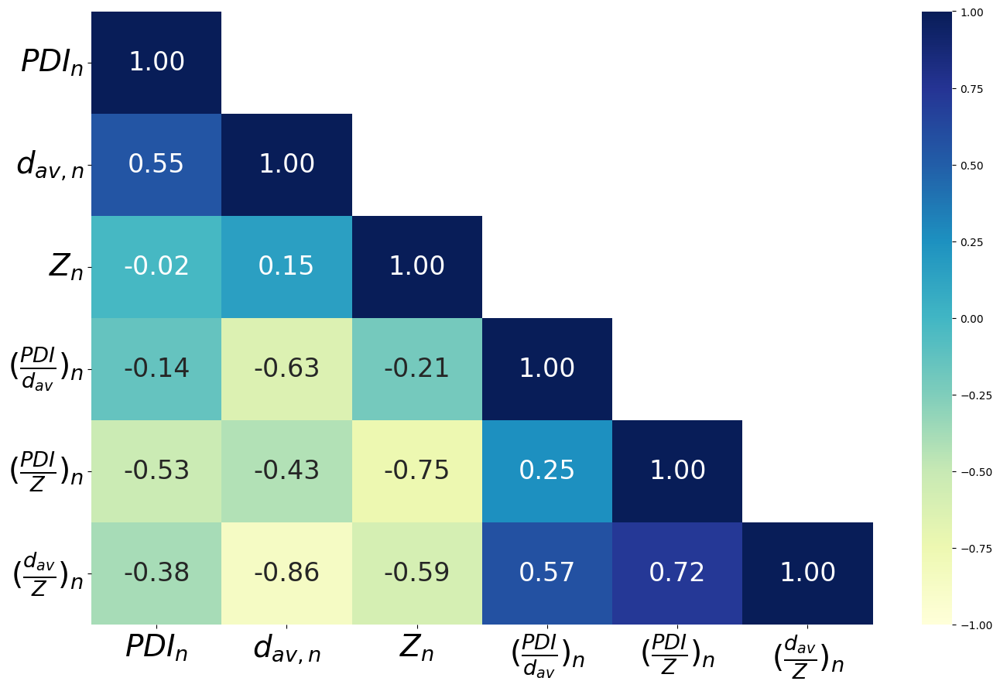

In [62]:
df_corr = features.copy().iloc[:, :6]

corr = df_corr.corr()
corr = corr.where(np.tril(np.ones(corr.shape)).astype(bool))
plt.figure(figsize=(14, 9), dpi=100)
#  cmap = [YlGnBu, PiYG, Reds, BuPu, PiYG]

corr_plot = sns.heatmap(corr,
                        cmap="YlGnBu",
                        annot=True,
                        vmax=1.0,
                        vmin=-1.0,
                        center=0.0,
                        fmt='.2f',
                        annot_kws={'size': 24})

corr_plot.set_yticklabels(corr_plot.get_yticklabels(), rotation=0, fontsize=28)
corr_plot.set_xticklabels(corr_plot.get_xticklabels(), rotation=0, fontsize=28)

plt.tight_layout()
# plt.savefig(path_to_save + '/colloid_params_part_corr_matrix.png', dpi=600)

## All features

CPU times: user 57.4 s, sys: 6.25 s, total: 1min 3s
Wall time: 1min 26s


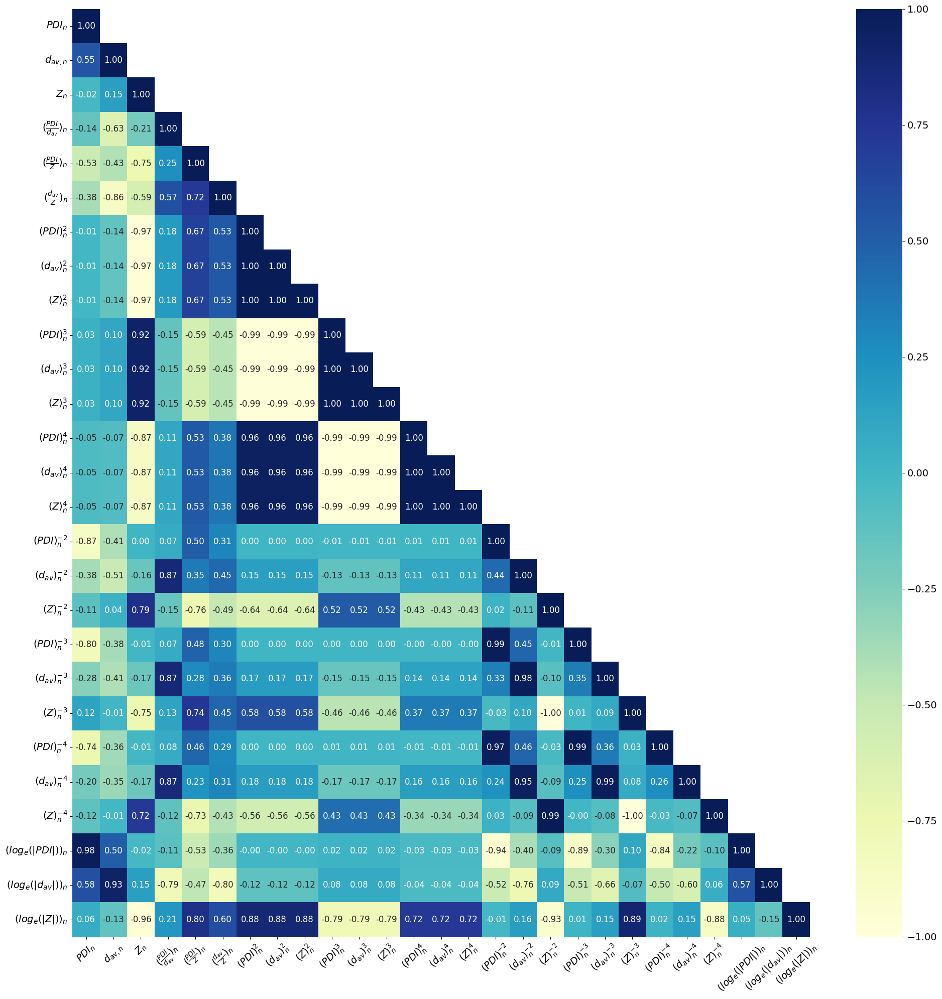

In [63]:
%%time

df_corr = features.copy().iloc[:, :-2]

corr = df_corr.corr()
corr = corr.where(np.tril(np.ones(corr.shape)).astype(bool))
plt.figure(figsize=(20, 20), dpi=100)
#  cmap = [YlGnBu, PiYG, Reds, BuPu]

corr_plot = sns.heatmap(corr,
                        cmap="YlGnBu",
                        annot=True,
                        vmax=1.0,
                        vmin=-1.0,
                        center=0.0,
                        fmt='.2f',
                        annot_kws={'size': 12}
                       )

corr_plot.figure.axes[-1].tick_params(labelsize=14)

corr_plot.set_yticklabels(corr_plot.get_yticklabels(), rotation=0, fontsize=14)
corr_plot.set_xticklabels(corr_plot.get_xticklabels(), rotation=45, fontsize=14)

plt.tight_layout()
plt.savefig(path_to_save + '/colloid_params_all_corr_matrix.png', dpi=900)

# Cluster analysis

In [26]:
path_to_save = './../../results/colloidal_parameters/cluster_analysis'

In [27]:
targets = list(features['$Class$'])
description = list(features['$Type$'])

## Main clustering functions

In [28]:
def calculate_v_measure(data, real_targets, n_clusters):
    v_measure = []
    for n_clusts in n_clusters:
        kmeans = KMeans(n_clusters=n_clusts, init='k-means++', random_state=42)
        kmeans.fit(data)
        
        # v-measure
        groups = kmeans.fit_predict(data)
        v_measure.append(v_measure_score(groups, targets))
        
#     mean_v_measure = round(np.mean(v_measure), 3)
    max_v_measure = round(max(v_measure), 3)
    
#     return mean_v_measure
    return max_v_measure

In [29]:
def optimal_number_of_clusters(data,
                               metric='silhouette',
                               targets=[],
                               max_n_clusters=10):
    n_metric_value_dict = {}
    
    for n_clusters in range(2, max_n_clusters+1):
        kmeans = KMeans(n_clusters=n_clusters,
                        init='k-means++',
                        random_state=42)
        kmeans.fit(data)
        
        if metric == 'silhouette':
            if n_clusters >= 2:
                n_metric_value_dict[n_clusters] = silhouette_score(data, kmeans.labels_)
        elif metric == 'v-measure':
            groups = kmeans.fit_predict(data)
            n_metric_value_dict[n_clusters] = v_measure_score(groups, targets)   
    
    opt_n_clusters = sorted(n_metric_value_dict.items(), key=lambda x:x[1], reverse=True)[0][0]
    return opt_n_clusters

In [30]:
def cluster_analysis(data,
                     n_clusters,
                     hue_col=[],
                     targets=[],
                     labels=[],
                     figsize=(16, 9),
                     markersize=600,
                     legend_size=20,
                     save='n',
                     name_of_file='curve',
                     dpi=300):
    if targets:
        figure_templ = [['upper left', 'right'],
                        ['middle left', 'right'],
                        ['lower left', 'right']]
    else:
        figure_templ = [['upper left', 'right'],
                        ['lower left', 'right']]
        
    fig, ax = plt.subplot_mosaic(figure_templ,
                                 gridspec_kw={'width_ratios': [3, 7], 'height_ratios': [1, 1, 1]},
                                 figsize=figsize,
                                 dpi=dpi,
                                 layout='constrained')
    
    clust_data = data.copy()

    x_range = list(range(1, 12))
    inertia = []
    silhouette = []
    if targets:
        v_measure = []
    for n_clusts in x_range:
        kmeans = KMeans(n_clusters=n_clusts, init='k-means++', random_state=42)
        kmeans.fit(clust_data)
        
        # inertia
        inertia.append(kmeans.inertia_)
        
        # v-measure
        groups = kmeans.fit_predict(clust_data)
        if targets:
            v_measure.append(v_measure_score(groups, targets))
        
        # silhouette-score
        if n_clusts >= 2:
            silhouette.append(silhouette_score(clust_data, kmeans.labels_))
            
    max_v_measure = round(max(v_measure), 3)
    mean_v_measure = round(np.mean(v_measure), 3)
    
    # Inertia Plot
    ax['upper left'].grid(False)
    ax['upper left'].tick_params(direction='in')
    ax['upper left'].set_title(f'Elbow method',
                               fontname='DejaVu Sans',
                               fontsize=20,
                               fontstyle='italic',
                               fontweight='heavy')
    ax['upper left'].plot(x_range,
                          inertia,
                          '-o',
                          color='orange')
    ax['upper left'].set_xlabel('$Number$ $of$ $clusters$',
                                fontname='DejaVu Sans',
                                fontsize=16)
    ax['upper left'].set_ylabel('$WCSS$',
                                fontname='DejaVu Sans',
                                fontsize=16)
    
    # V-measure Plot
    if targets:
        ax['middle left'].grid(False)
        ax['middle left'].tick_params(direction='in')
        ax['middle left'].set_title(f'V-measure',
                                   fontname='DejaVu Sans',
                                   fontsize=20,
                                   fontstyle='italic',
                                   fontweight='heavy')
        ax['middle left'].plot(x_range,
                              v_measure,
                              '-o',
                              color='orange')
        ax['middle left'].set_xlabel('$Number$ $of$ $clusters$',
                                    fontname='DejaVu Sans',
                                    fontsize=16)
        ax['middle left'].set_ylabel('$V$',
                                    fontname='DejaVu Sans',
                                    fontsize=16)
    else:
        pass

    # Silhouette-score Plot
    ax['lower left'].grid(False)
    ax['lower left'].tick_params(direction='in')
    ax['lower left'].set_title(f'Silhouette coefficient',
                               fontname='DejaVu Sans',
                               fontsize=20,
                               fontstyle='italic',
                               fontweight='heavy')
    ax['lower left'].plot(x_range[1:],
                          silhouette,
                          '-o',
                          color='orange')
    ax['lower left'].set_xlabel('$Number$ $of$ $clusters$',
                                fontname='DejaVu Sans',
                                fontsize=16)
    ax['lower left'].set_ylabel('$SS$',
                                fontname='DejaVu Sans',
                                fontsize=16)

    def generate_color():
        r, g, b = random(), random(), random()
        return (r, g, b)
    
    kmeans = KMeans(n_clusters=n_clusters,
                    init='k-means++',
                    random_state=42,
                    max_iter=10_000)
    
    groups = kmeans.fit_predict(clust_data)
    
    info_data = pd.DataFrame(groups, columns=['cluster_label'])
    info_data['cluster_label'] += 1
    if hue_col:
        info_data.insert(loc=1, column='$Description$', value=hue_col)
    info_data = info_data.sort_values(by='cluster_label')

    ax['right'].grid(True)
    ax['right'].tick_params(direction='in')
    ax['right'].set_title('Scatter Plot',
                          fontname='DejaVu Sans',
                          fontsize=20,
                          fontstyle='italic',
                          fontweight='heavy')
    
    ax_labels = list(clust_data.columns)
    
    sns.scatterplot(data=clust_data,
                    x=ax_labels[0],
                    y=ax_labels[1],
                    hue=hue_col,
                    palette='Dark2',
                    s=markersize,
                    alpha=1.0,
                    ax=ax['right']
                   )
    
#     ax['right'].plot([], [], ' ', label='$\overline{V}$' + f'= {mean_v_measure}')
    ax['right'].plot([], [], ' ', label='$V_{max}}$' + f'= {max_v_measure}')

    kmeans = KMeans(n_clusters=n_clusters,
                    init='k-means++',
                    random_state=42,
                    max_iter=10_000
                   )
    
    groups = kmeans.fit_predict(clust_data)
    
    for i in range(n_clusters):
        color = generate_color()
        
        x_f = clust_data[groups == i].iloc[:, 0]
        y_f = clust_data[groups == i].iloc[:, 1]
        
        x_cl = kmeans.cluster_centers_[:, 0][i]
        y_cl = kmeans.cluster_centers_[:, 1][i]        
        
        ax['right'].scatter(x=x_cl,
                            y=y_cl,
                            marker='s',
                            edgecolors='black',
                            color='red',
                            s=markersize // 4,
#                             label=f'$Centroid$ ${i+1}$'
                           )
        
        x_point_cluster = [[x, x_cl] for x in x_f]
        y_point_cluster = [[y, y_cl] for y in y_f]
        
        for pair_x, pair_y in zip(x_point_cluster, y_point_cluster):
            ax['right'].plot(pair_x,
                             pair_y,
                             linewidth=2.5,
                             color='black'
                            )

    if len(labels) > 0:
        for label, x, y in zip(labels, clust_data.iloc[:, 0], clust_data.iloc[:, 1]):
            ax['right'].annotate(f'$\\bf{label}$',
                                 xy=(x, y),
                                 fontsize=10,
                                 ha='center',
                                 va='center'
                                )
    else:
        pass
    
    ax['right'].set_xlabel(ax_labels[0], fontname='DejaVu Sans', fontsize=24, style='italic')
    ax['right'].set_ylabel(ax_labels[1], fontname='DejaVu Sans', fontsize=24, style='italic')
    
    ax['right'].legend(#title='$Cluster$ $centroid$',
                       fancybox=True,
                       shadow=True,
                       loc='best',
                       prop={'size': legend_size})#.get_title().set_fontsize('14')
    
    if save in ['y', 'Y', 'yes']:
        plt.savefig(name_of_file + '.png',dpi=dpi)
        info_data.to_excel(name_of_file + '.xlsx',
                           index=False,
#                            encoding='utf-8-sig'
                          )
    return info_data

## Feature importance

### Calculation *v-measure* for all features pairs

In [31]:
features.head(3)

,$PDI_{n}$,"$d_{av, n}$",$Z_{n}$,$(\frac{PDI}{d_{av}})_{n}$,$(\frac{PDI}{Z})_{n}$,$(\frac{d_{av}}{Z})_{n}$,$(PDI)_{n}^2$,$(d_{av})_{n}^2$,$(Z)_{n}^2$,$(PDI)_{n}^3$,...,$(d_{av})_{n}^{-3}$,$(Z)_{n}^{-3}$,$(PDI)_{n}^{-4}$,$(d_{av})_{n}^{-4}$,$(Z)_{n}^{-4}$,$(log_{e}(|PDI|))_{n}$,$(log_{e}(|d_{av}|))_{n}$,$(log_{e}(|Z|))_{n}$,$Type$,$Class$
0,0.329073,0.290777,1.000000,0.107421,0.000000,0.102205,0.000000,0.000000,0.000000,1.000000,...,0.007459,0.000000,0.107897,0.001515,1.000000,0.466636,0.599089,0.000000,$GO$,1
1,0.017572,0.018524,0.333333,0.352948,0.979169,0.977305,0.523500,0.523500,0.523500,0.602873,...,0.502012,0.984858,0.860236,0.399128,0.005176,0.032370,0.084927,0.802232,$GO$,1
2,1.000000,0.769042,0.148148,0.072610,0.652504,0.510288,0.770547,0.770547,0.770547,0.312581,...,0.000322,0.995416,0.000000,0.000033,0.001402,1.000000,0.910232,0.919386,$GO$,1


In [32]:
%%time

features_for_v_measure = features.iloc[:, :-2].columns
n_features = len(features_for_v_measure)

v_dict = {}

n_clusters = range(1, 11)

for i in range(n_features):
    feature_1 = features_for_v_measure[i]
    for j in range(i+1, n_features):
        feature_2 = features_for_v_measure[j]
        pair_of_features = [feature_1, feature_2]

        res = calculate_v_measure(data=features[pair_of_features],
                                  real_targets=targets,
                                  n_clusters=n_clusters)
        
        v_dict[tuple(pair_of_features)] = res
            
v_dict = dict(sorted(v_dict.items(), key=lambda x: x[1], reverse=True))

CPU times: user 10min 1s, sys: 33.8 s, total: 10min 34s
Wall time: 4min 23s


In [33]:
features_pairs = list(v_dict.keys())
features_pairs = [f'({";".join(pair)})' for pair in features_pairs]

features_v_values = list(v_dict.values())

In [34]:
features_pairs_top10 = features_pairs[:10]
features_v_values_top10 = features_v_values[:10]

### Horizontal Bar Chart

In [35]:
# fig = plt.figure(figsize=(4, 10), dpi=300, linewidth=1.0)

# plt.grid(True)
# plt.tick_params(direction='in')
# ax = fig.gca()

# ax.set_title('Feature Importance',
#              fontname='DejaVu Sans',
#              fontsize=14,
#              fontstyle='italic',
#              fontweight='bold')

# barh_plot = ax.barh(features_pairs_top10[::-1], features_v_values_top10[::-1])

# ax.set_xlabel('$V_{max}$',
#               fontname='DejaVu Sans',
#               fontsize=14)

# ax.set_yticklabels(features_pairs_top10[::-1], rotation=0, fontsize=16)

# plt.tight_layout()
# plt.savefig(path_to_save + '/feature_importance_barh.png', dpi=600)
# plt.show()

### Vertical Bar Chart

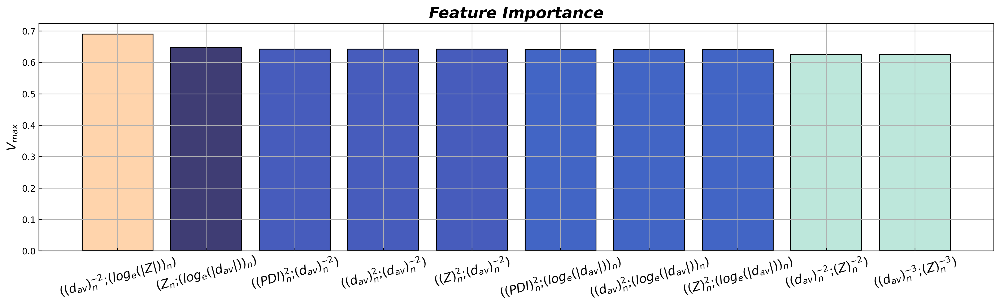

In [36]:
fig = plt.figure(figsize=(16, 5), dpi=300, linewidth=1.0)

plt.grid(True)
plt.tick_params(direction='in')
ax = fig.gca()

ax.set_title('Feature Importance',
             fontname='DejaVu Sans',
             fontsize=18,
             fontstyle='italic',
             fontweight='bold')

my_cmap = plt.get_cmap('icefire')
rescale = lambda y: (y - np.min(y)) / (np.max(y) - np.min(y))

barh_plot = ax.bar(features_pairs_top10,
                   features_v_values_top10,
                   color=my_cmap(rescale(features_v_values_top10)),
                   edgecolor='black',
                   alpha=1.0
                  )

ax.set_ylabel('$V_{max}$',
              fontname='DejaVu Sans',
              fontsize=14)

ax.set_xticklabels(features_pairs_top10, rotation=15, fontsize=14)

plt.tight_layout()
plt.savefig(path_to_save + '/feature_importance_top10_bar.png', dpi=600)
plt.show()

## Clustering

In [37]:
dpi = 600

CPU times: user 2min 17s, sys: 7.05 s, total: 2min 24s
Wall time: 2min 18s


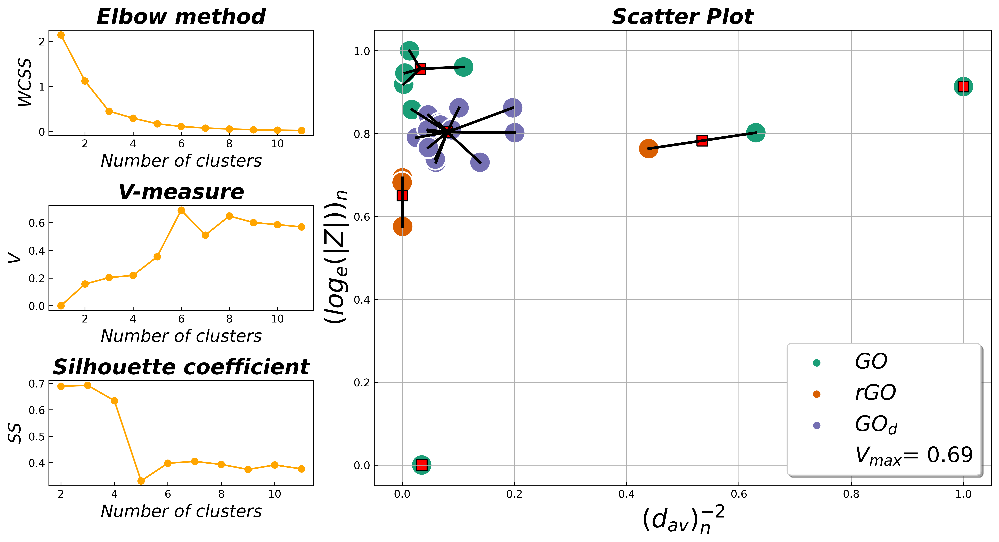

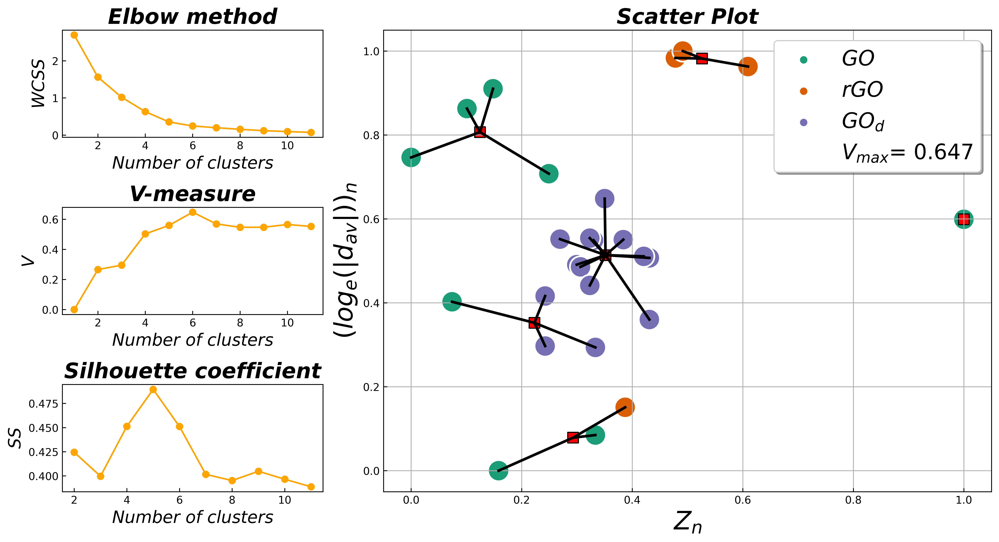

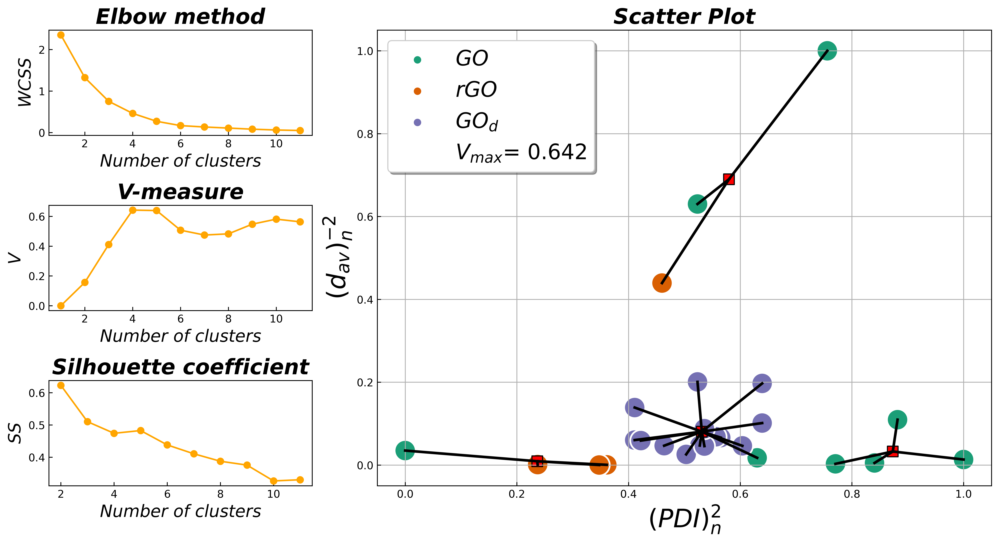

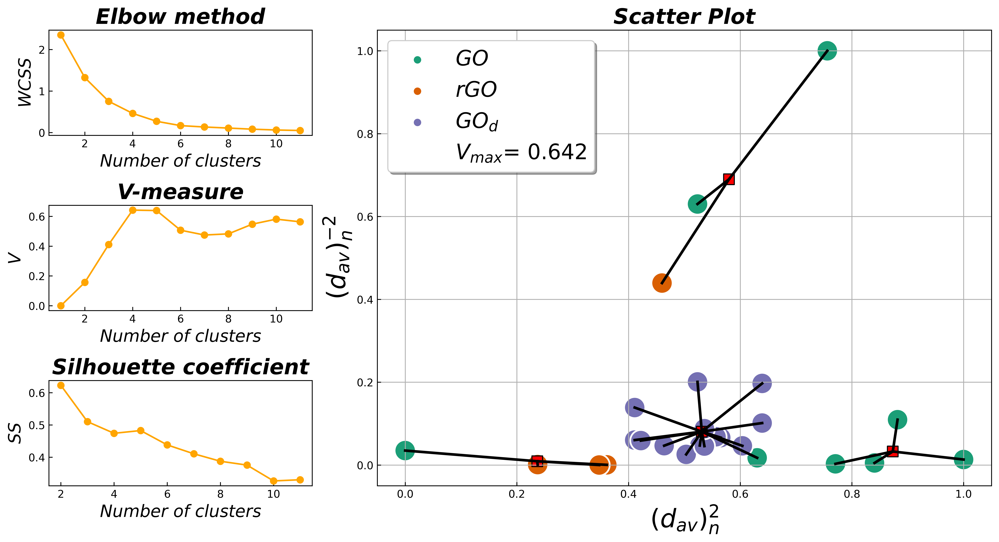

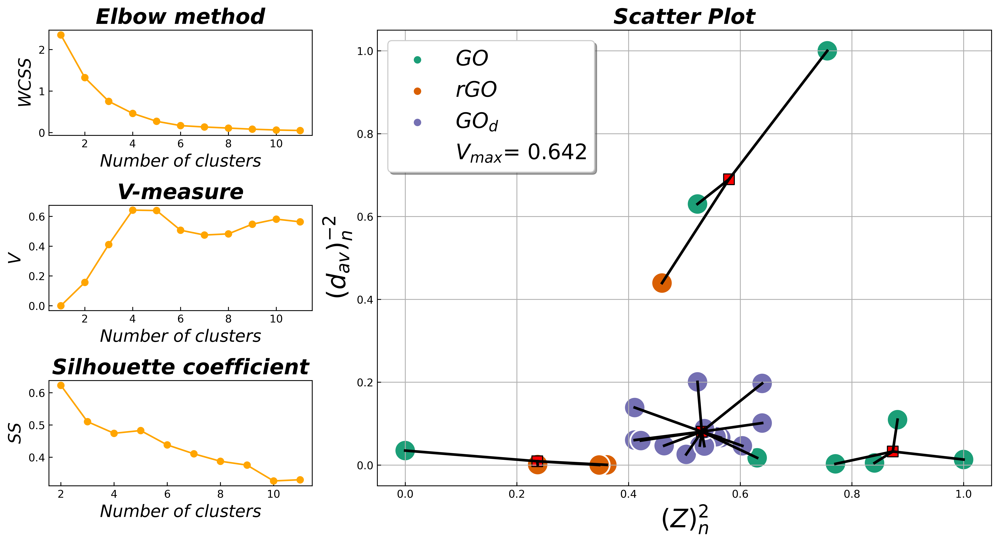

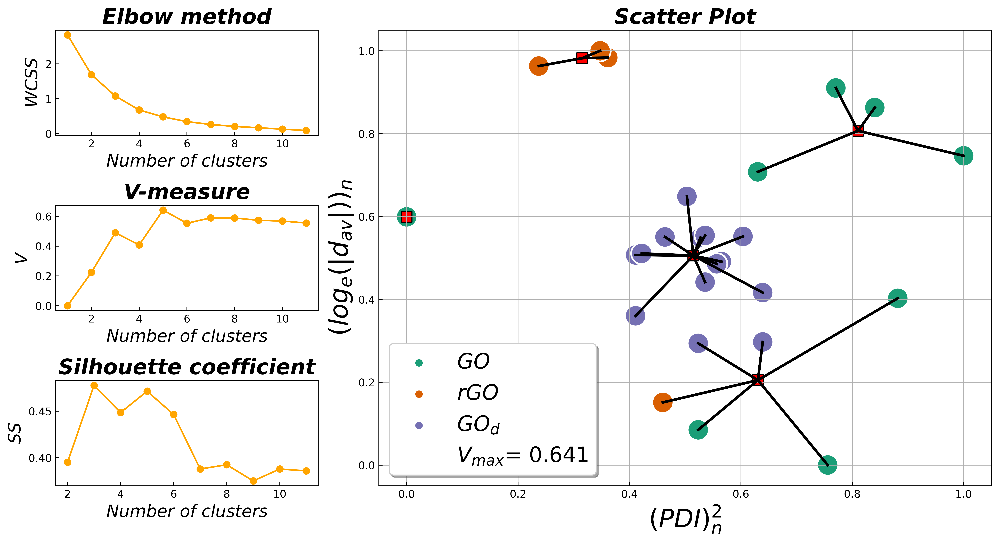

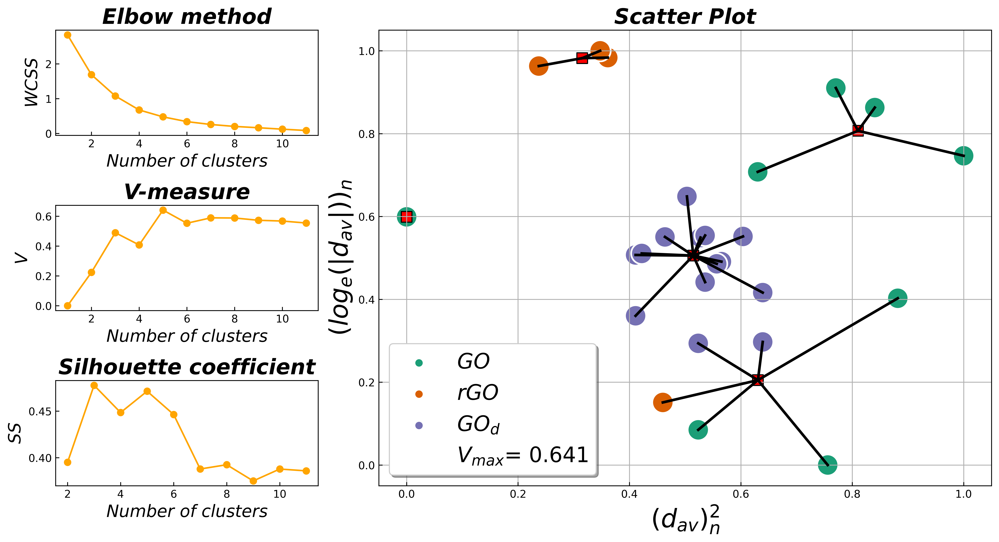

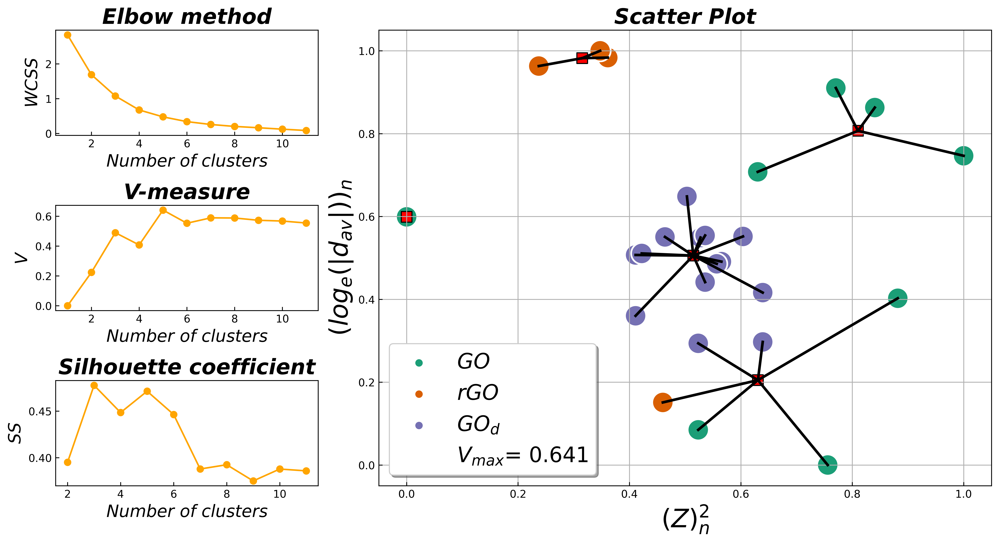

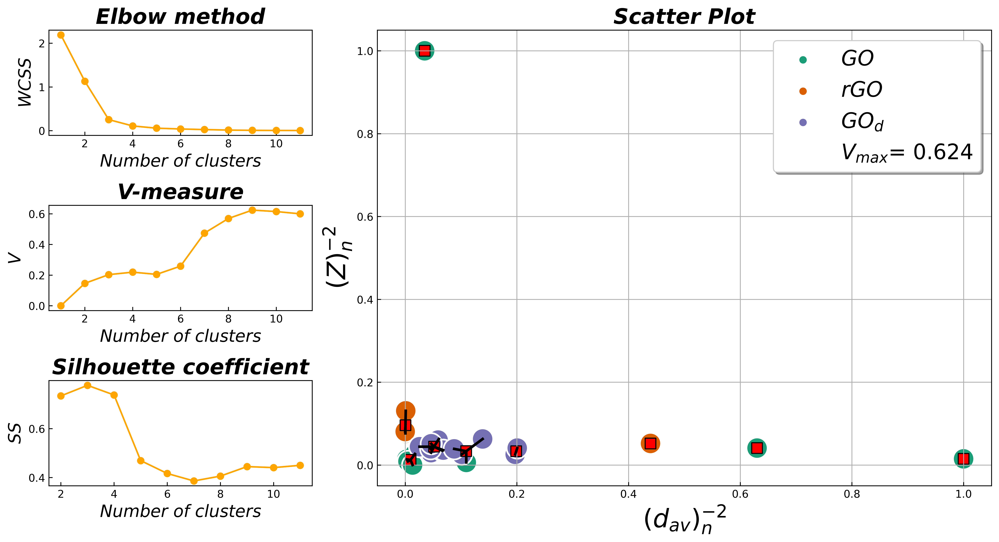

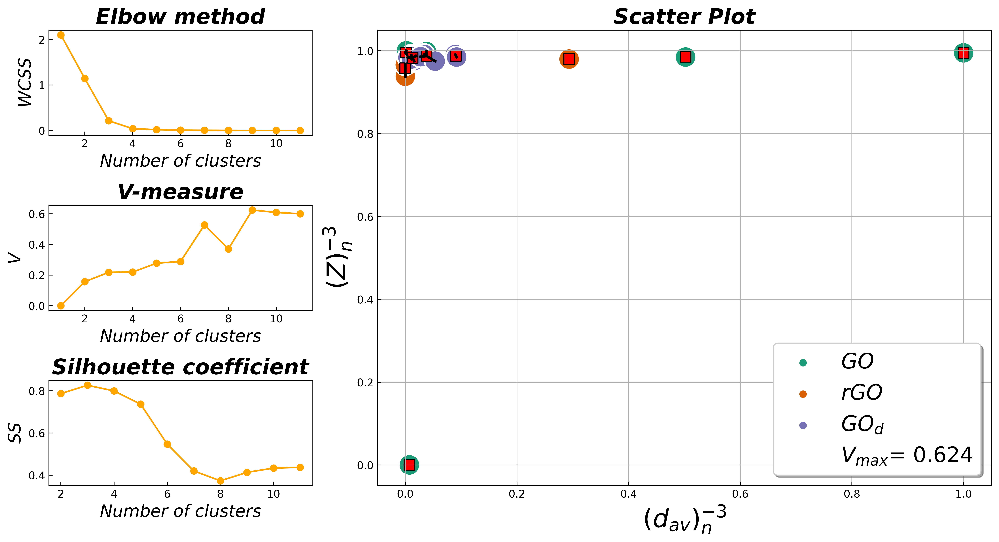

In [38]:
%%time

max_f = 10

top_features = list(map(list, list(v_dict.keys())[:max_f]))

for i in range(max_f):
    features_pair = features[top_features[i]]

    n_clusters = optimal_number_of_clusters(data=features_pair,
                                            metric='v-measure',
                                            targets=targets)

    cluster_analysis(data=features_pair,
                     n_clusters=n_clusters,
                     targets=targets,
                     hue_col=description,
    #                  labels=data['id'],
                     figsize=(13, 7),
                     markersize=400,
                     save='y',
                     name_of_file=path_to_save + f'/top{i+1}_pair',
                     dpi=dpi)